In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout

pd.set_option('display.max_rows', 300) # specifies number of rows to show
#pd.options.display.float_format = '{:40,.4f}'.format # specifies default number format to 4 decimal places
plt.style.use('ggplot') # specifies that graphs should use ggplot styling
%matplotlib inline

In [2]:
import networkx as nx
import operator

year = pd.read_csv('year5_logret.csv')
year

,Unnamed: 0,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
0,A,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,AAL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,AAP,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,AAPL,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,ABBV,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,ABC,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,ABT,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,ACN,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,ADBE,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,ADI,1,0,0,0,0,0,0,0,0,...,0,1,1,1,0,1,0,0,0,0


In [3]:
year.set_index('Unnamed: 0', inplace=True)
year.index.name = None
year

,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
A,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0
AAL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAPL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABBV,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ACN,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
ADBE,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ADI,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0,1,0,0,0,0


In [4]:
# Create edge-list (delete a triangle)
links = year.where(np.triu(np.ones(year.shape)).astype(np.bool))
links = links.stack().reset_index()
links.columns = ['stock1', 'stock2','value']
links['value'] = links['value'].astype(int)
links

,stock1,stock2,value
0,A,A,0
1,A,AAL,0
2,A,AAP,0
3,A,AAPL,0
4,A,ABBV,0
5,A,ABC,0
6,A,ABT,0
7,A,ACN,0
8,A,ADBE,0
9,A,ADI,1


In [5]:
# Only keep edges=1
links_filtered = links.loc[(links['value'] == 1)]
conn_nodes = links_filtered.groupby('stock1').count()
print('Number of connected nodes:', len(conn_nodes), 
      '\nNumber of edges:', links_filtered['value'].count())
links_filtered

Number of connected nodes: 256 
Number of edges: 2934


,stock1,stock2,value
9,A,ADI,1
34,A,AMG,1
36,A,AMP,1
137,A,DHR,1
162,A,EOG,1
254,A,IVZ,1
284,A,LNC,1
322,A,MTD,1
366,A,PKI,1
392,A,RJF,1


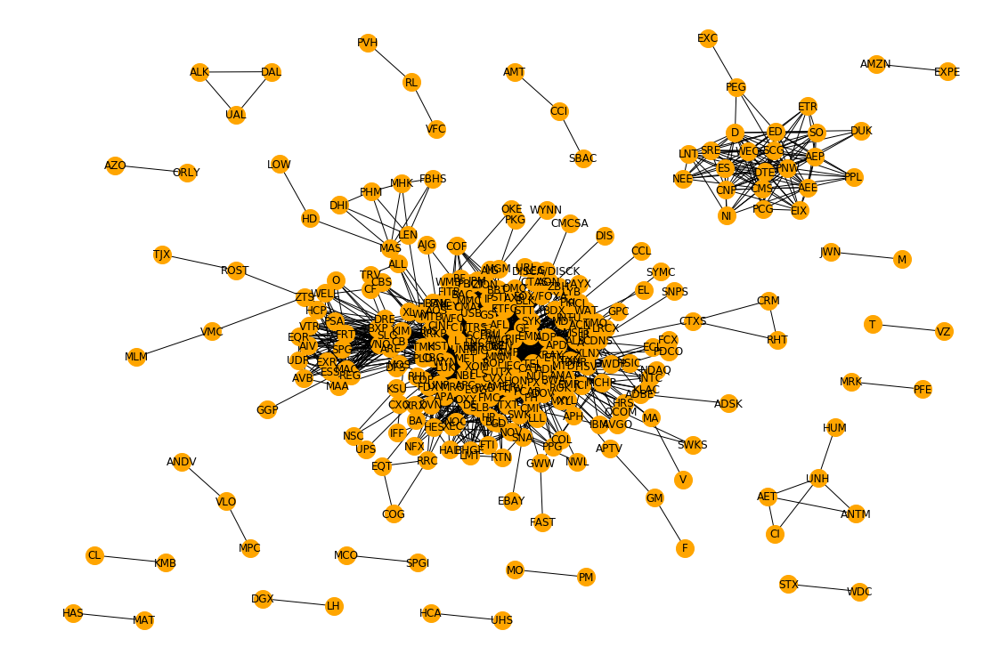

In [6]:
# Draw network graph
G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 10

nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=12)
plt.savefig("graph.png")
plt.show()

Number of components: 19


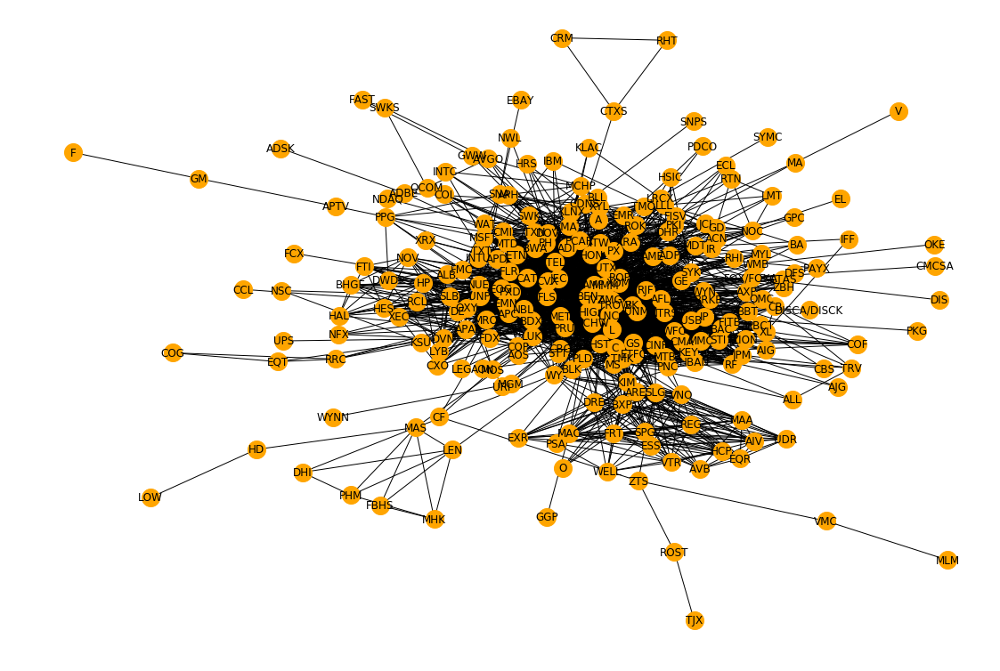

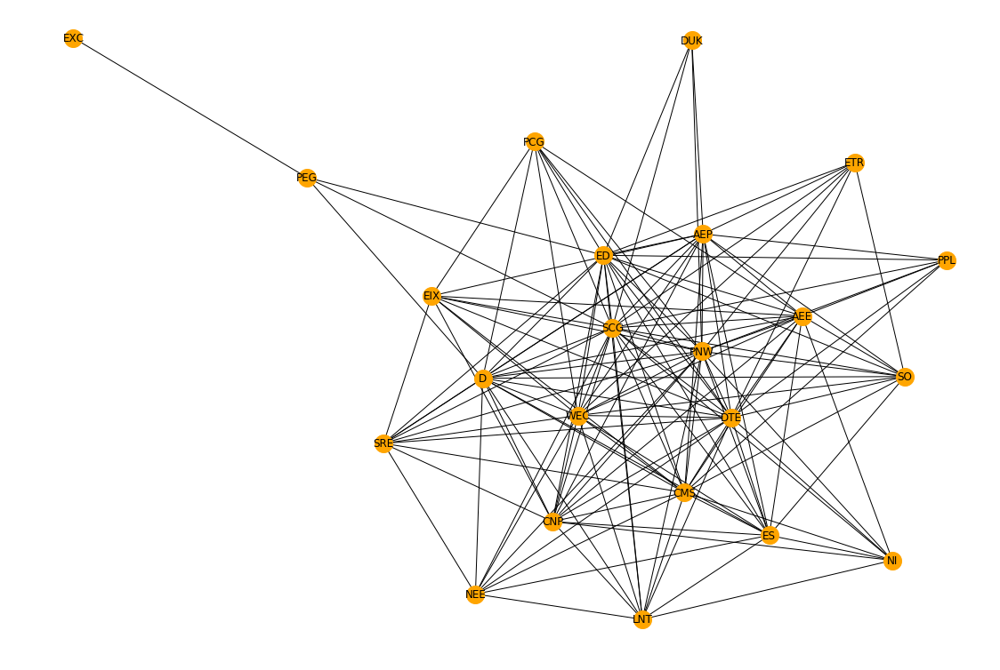

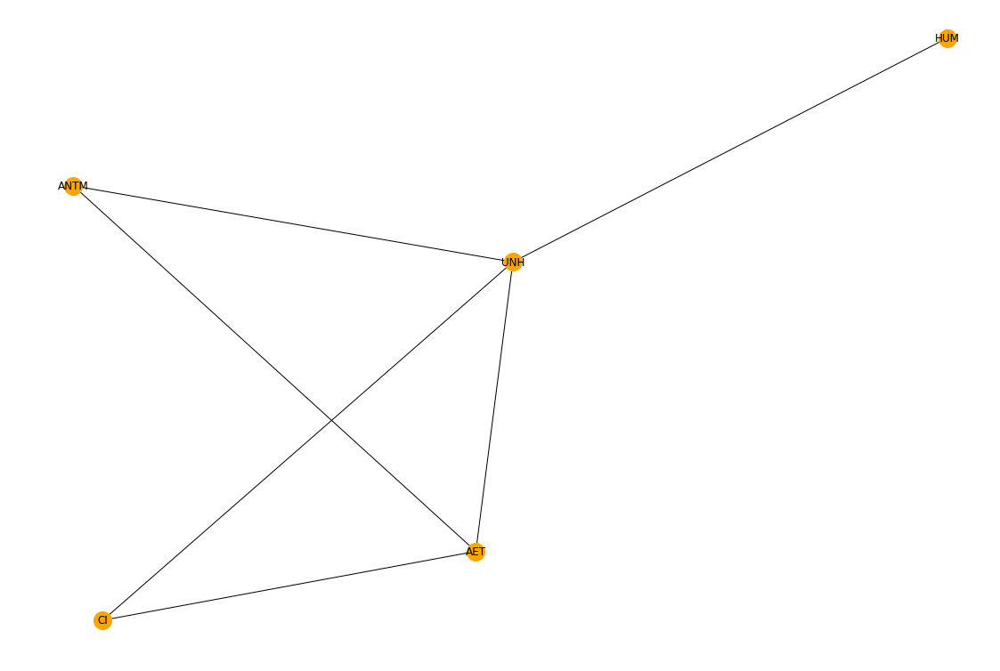

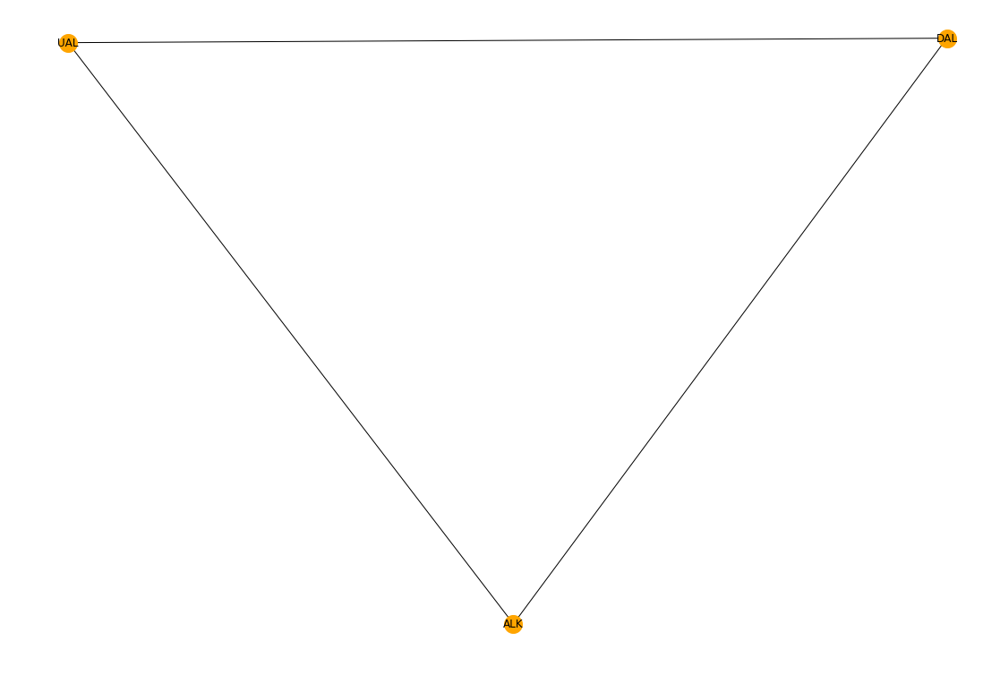

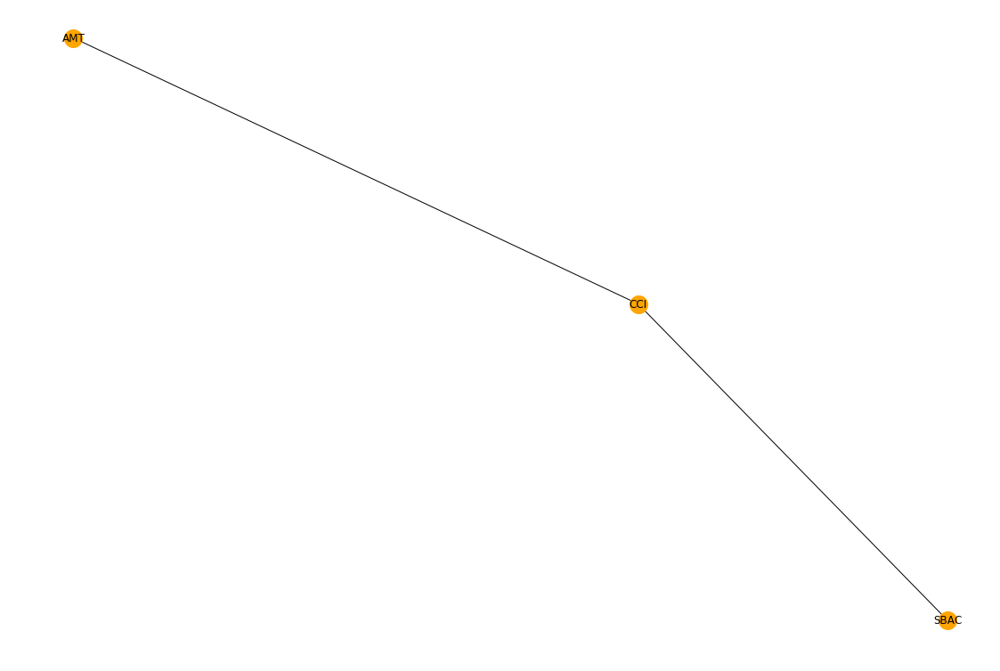

...

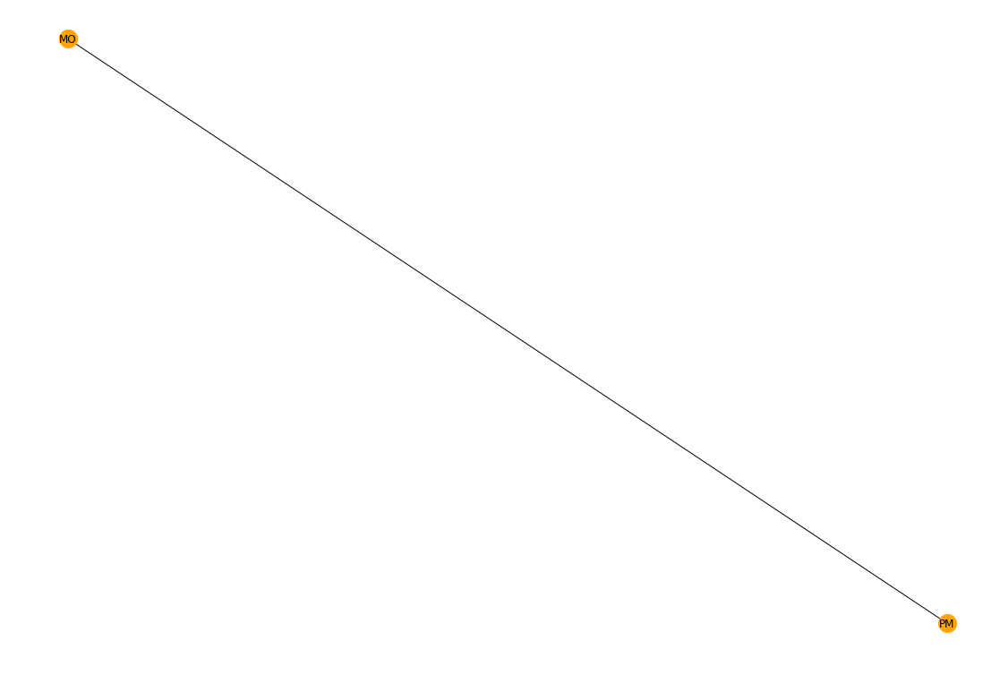

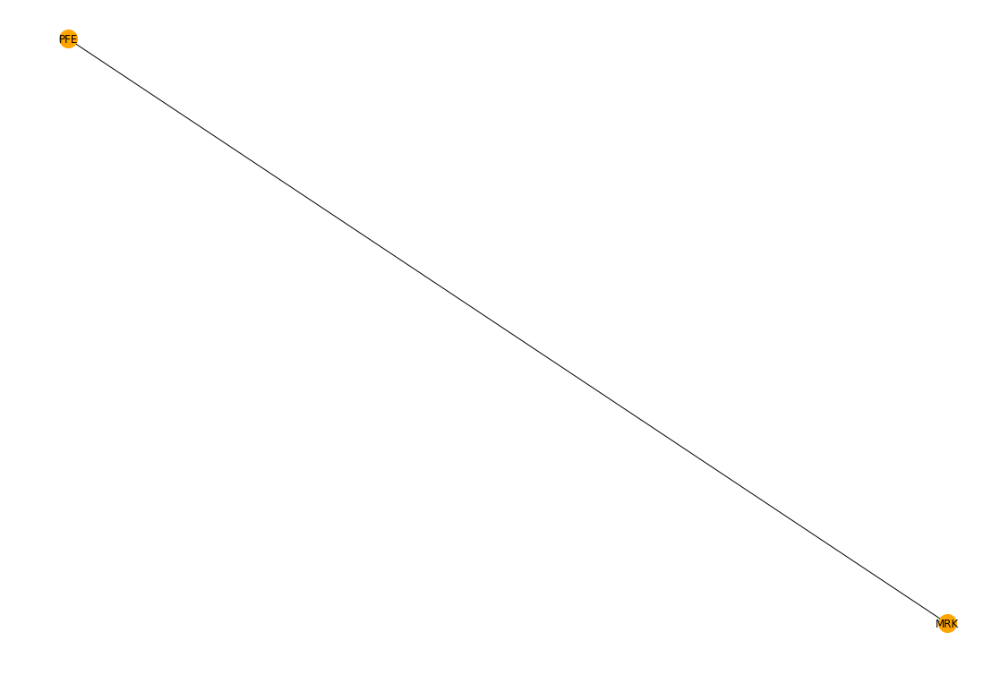

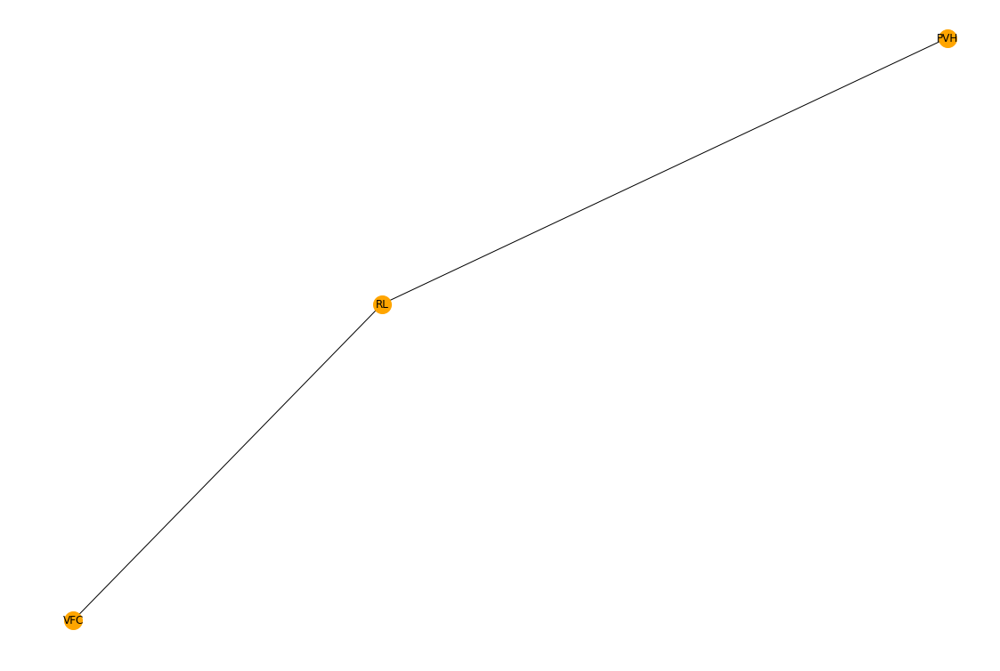

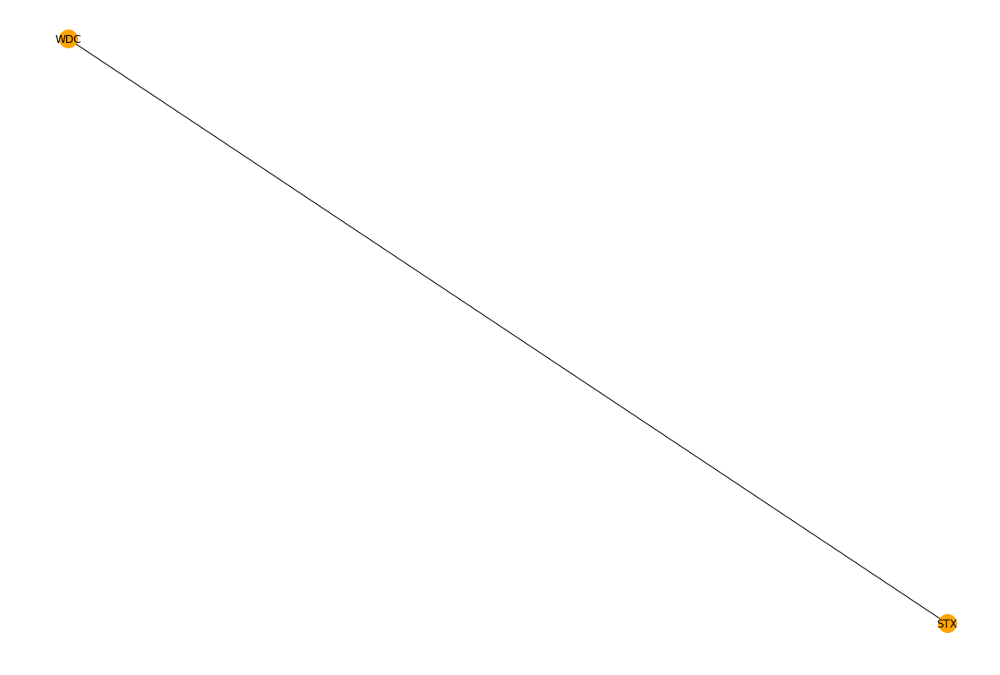

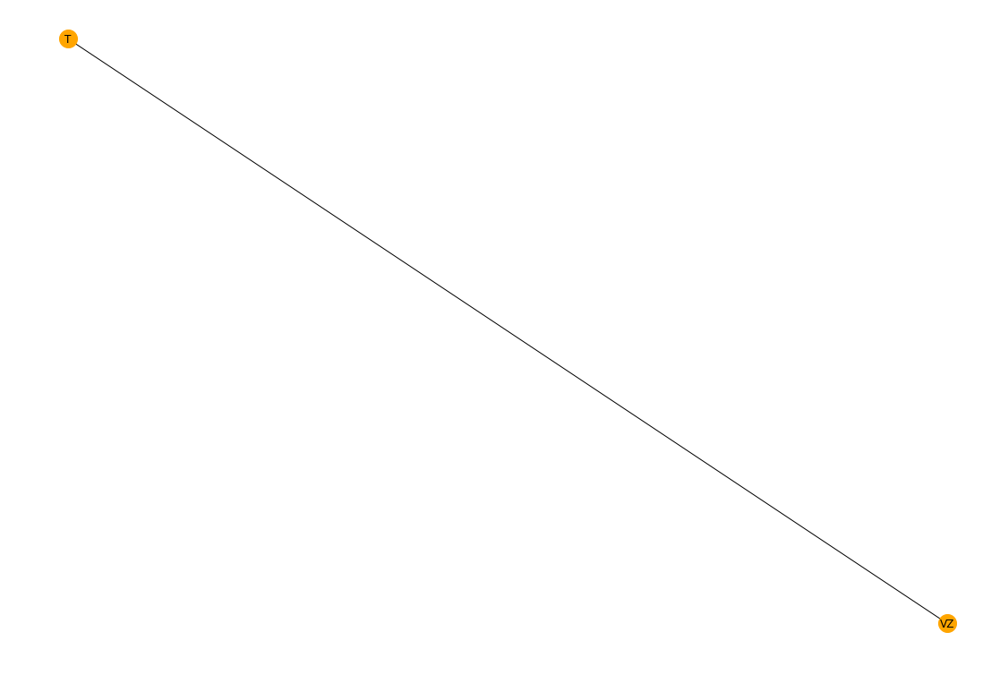

In [8]:
# Show the subgraphs (disconnected components) of the network
subgraphs = list(nx.connected_component_subgraphs(G))
print('Number of components:', len(subgraphs))

for sub_graph in subgraphs:
    nx.draw(sub_graph, pos=graphviz_layout(sub_graph), with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=12)
    plt.show()

In [9]:
# Find the next community in the network
from networkx.algorithms import community

communities_generator = community.girvan_newman(G)
top_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)
next_level_communities = next(communities_generator)
sorted(map(sorted, next_level_communities))

[['A',
  'ACN',
  'ADBE',
  'ADI',
  'ADP',
  'ADSK',
  'AFL',
  'AIG',
  'AIV',
  'AJG',
  'ALB',
  'ALL',
  'AMAT',
  'AME',
  'AMG',
  'AMP',
  'AON',
  'AOS',
  'APA',
  'APC',
  'APD',
  'APH',
  'APTV',
  'ARE',
  'AVB',
  'AVGO',
  'AXP',
  'BA',
  'BAC',
  'BBT',
  'BDX',
  'BEN',
  'BHGE',
  'BK',
  'BLK',
  'BLL',
  'BRKB',
  'BWA',
  'BXP',
  'C',
  'CAT',
  'CB',
  'CBG',
  'CBS',
  'CCL',
  'CDNS',
  'CINF',
  'CMA',
  'CMCSA',
  'CMI',
  'COF',
  'COG',
  'COL',
  'COP',
  'CTAS',
  'CVX',
  'CXO',
  'DE',
  'DFS',
  'DHR',
  'DIS',
  'DISCA/DISCK',
  'DOV',
  'DRE',
  'DVN',
  'DWDP',
  'EBAY',
  'ECL',
  'EL',
  'EMN',
  'EMR',
  'EOG',
  'EQR',
  'EQT',
  'ESS',
  'ETFC',
  'ETN',
  'EXR',
  'F',
  'FAST',
  'FCX',
  'FDX',
  'FISV',
  'FITB',
  'FLR',
  'FLS',
  'FMC',
  'FOX/FOXA',
  'FRT',
  'FTI',
  'GD',
  'GE',
  'GGP',
  'GM',
  'GPC',
  'GS',
  'GWW',
  'HAL',
  'HBAN',
  'HCP',
  'HES',
  'HIG',
  'HON',
  'HP',
  'HRS',
  'HSIC',
  'HST',
  'IBM',
  'IFF',
  

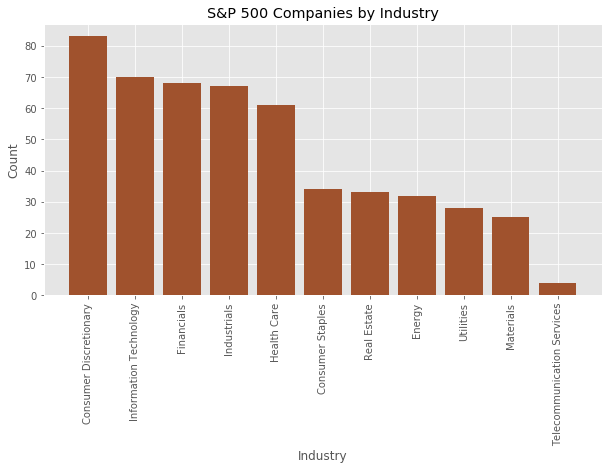

In [10]:
# Create bar chart aggregating companies by industry
companies = pd.read_csv('SP 500 Data/sp500.csv')

companies.rename(columns = {'SP500': 'Company'}, inplace=True)
first_words = companies.apply(lambda x: x.str.split().str[0])
companies.Company = first_words.Company

companies.Company.replace('BF/B', 'BFB', inplace=True)
companies.Company.replace('BRK/B', 'BRKB', inplace=True)

industries = companies.groupby('Industry').count().sort_values(['Company'], ascending=False)
industries.rename(columns={'Company': 'Count'}, inplace=True)
companies.set_index('Company', inplace=True)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 5

plt.bar(industries.index, industries.Count, color='sienna')
plt.xlabel('Industry')
plt.ylabel('Count')
plt.title('S&P 500 Companies by Industry')
plt.xticks(rotation=90)
plt.show()

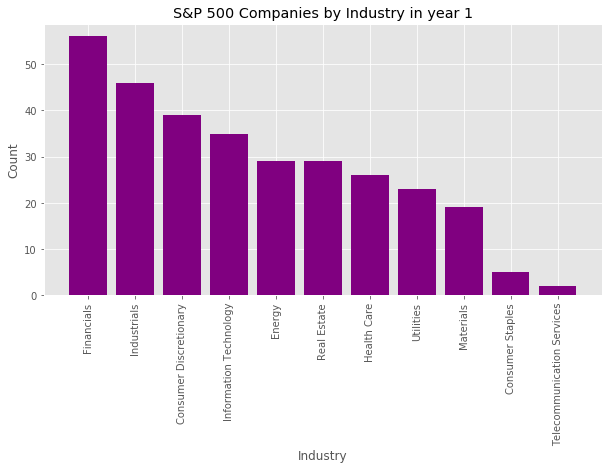

In [11]:
# Allocate the corresponding industry to each company in the network for a particular year
comp_dict = companies.to_dict()

colors = ['cyan', 'lightgreen', 'orange', 'red', 'yellow', 'gray', 'goldenrod', 'magenta', 'brown', 'lightblue', 'pink']

dual_comp = ['DISCA/DISCK', 'FOX/FOXA', 'GOOG/GOOGL', 'NWS/NWSA', 'UA/UAA']     

node_dict = dict(G.nodes())

for node in node_dict:
    for ticker in dual_comp:
        if node == ticker:
            new_node = node.split('/')[0]
            break
        else:
            new_node = node
    node_dict[node] = comp_dict['Industry'][new_node]
node_dict

node_ind = pd.DataFrame.from_dict(node_dict, orient='index')
node_ind.rename(columns={0: 'Industry'}, inplace=True)
node_ind.index.names = ['Company']
ind_freq = pd.DataFrame(node_ind.groupby('Industry').size())
ind_freq.rename(columns={0: 'Count'}, inplace=True)
ind_freq.sort_values(['Count'], ascending=False, inplace=True)

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 5

plt.bar(ind_freq.index, ind_freq['Count'], color='purple')
plt.xlabel('Industry')
plt.ylabel('Count')
plt.title('S&P 500 Companies by Industry in year 1')
plt.xticks(rotation=90)
plt.show()

In [12]:
# Number of connected nodes, number of edges
nodes = G.nodes
edges = G.edges
print(len(nodes), len(edges))

309 2934


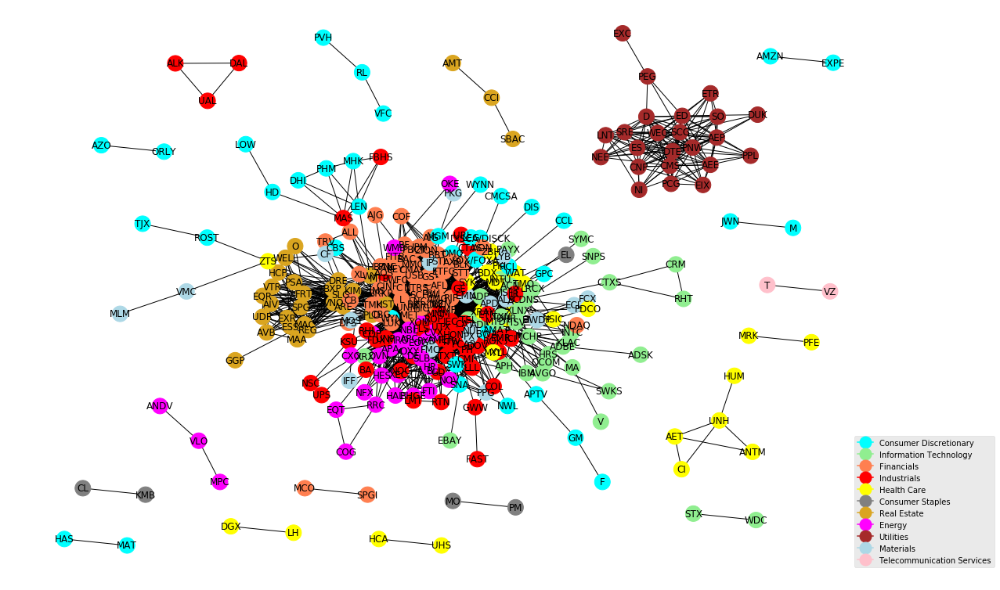

In [34]:
# Allocate a different color to each industry
color_map = {}
colors = ['cyan', 'lightgreen', 'coral', 'red', 'yellow', 'gray', 'goldenrod', 'magenta', 'brown', 'lightblue', 'pink']

i = 0
for index in industries.index:
    color_map[index] = colors[i]
    i += 1

G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')

fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 10

# Plot network graph with legend using different colors for nodes depending on industry
from matplotlib.lines import Line2D

legend_circles = []
for i in range(len(colors)):
    legend_circles.append(Line2D([0], [0], marker='o', color=colors[i], label=industries.index[i], markerfacecolor=colors[i], markersize=15))

nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color=[color_map[node_dict[node]] for node in node_dict], node_size=400, edge_color='black', linewidths=1, font_size=12)
plt.legend(handles=legend_circles, loc='lower right', bbox_to_anchor=(1.15,0))
plt.savefig("network.png", bbox_inches='tight')
plt.show()

In [14]:
dict_nodes = dict(G.nodes())

for node in dict_nodes:
    for ticker in dual_comp:
        if node == ticker:
            new_node = node.split('/')[0]
            break
        else:
            new_node = node
    dict_nodes[node] = comp_dict['Industry'][new_node]
    
len(dict_nodes)

309

In [15]:
# Adjacency matrix of network
adj_mat = nx.adjacency_matrix(G)
adj_mat = pd.DataFrame(adj_mat.todense())
adj_mat

,0,1,2,3,4,5,6,7,8,9,...,299,300,301,302,303,304,305,306,307,308
0,0,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,1,0,1,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,1,1,0,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
3,1,1,1,0,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1,1,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,1,1,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
6,1,1,1,1,1,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
7,1,1,1,1,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,1,1,1,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9,1,0,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
from networkx.algorithms import tree

mst = tree.minimum_spanning_edges(G, algorithm='kruskal', data=False)
edgelist = list(mst)
pd.DataFrame(sorted(edgelist))

,0,1
0,A,ADI
1,A,AMG
2,A,AMP
3,A,DHR
4,A,EOG
5,A,IVZ
6,A,LNC
7,A,MTD
8,A,PKI
9,A,RJF


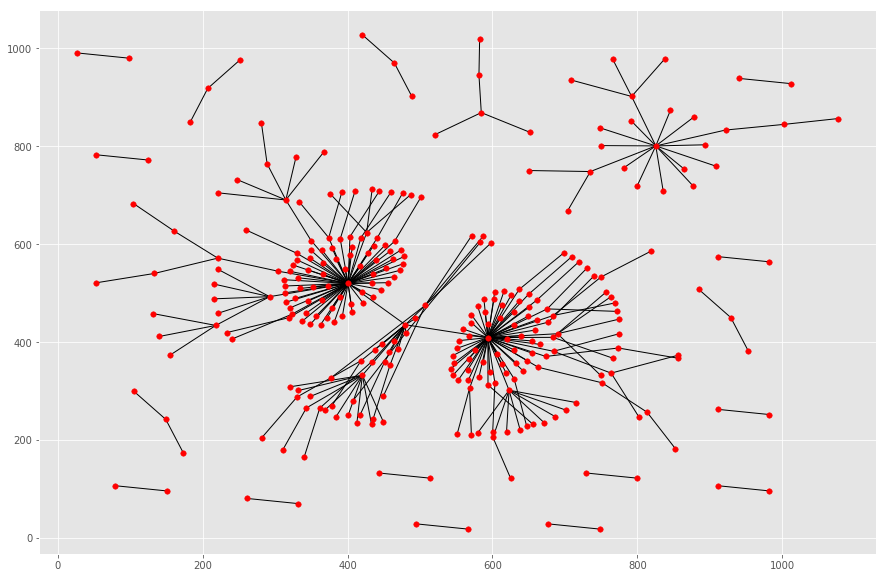

In [17]:
# Draw Minimum Spanning Tree of network
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 15
fig_size[1] = 10

T = nx.minimum_spanning_tree(G)
#pd.DataFrame(sorted(T.edges()))
plt.figure()
nx.draw_networkx(T, pos=graphviz_layout(T), with_labels=False, node_size=30)
plt.savefig("mst.png")
plt.show()

## Network Measures ##

In [18]:
# Degree centrality of nodes
deg_c = nx.degree_centrality(G)
deg_c_sorted = sorted(deg_c.items(), key=operator.itemgetter(1), reverse=True)

deg_df = pd.DataFrame(deg_c_sorted, columns=['company', 'value'])
deg_df.set_index('company', inplace=True)
deg_df

,value
company,
AMG,0.438312
AMP,0.396104
IVZ,0.363636
TROW,0.334416
LNC,0.311688
MMM,0.305195
HIG,0.288961
BEN,0.275974
JEC,0.256494


In [19]:
# Closeness centrality of nodes
close_c = nx.closeness_centrality(G)
close_c_sorted = sorted(close_c.items(), key=operator.itemgetter(1), reverse=True)

close_df = pd.DataFrame(close_c_sorted, columns=['company', 'value'])
close_df.set_index('company', inplace=True)
close_df

,value
company,
AMG,0.508681
IVZ,0.476105
AMP,0.466905
TROW,0.456971
LNC,0.450580
MMM,0.442331
BEN,0.434379
HIG,0.426708
JEC,0.421130


In [20]:
# Betweenness centrality of nodes
betw_c = nx.betweenness_centrality(G)
betw_c_sorted = sorted(betw_c.items(), key=operator.itemgetter(1), reverse=True)

betw_df = pd.DataFrame(betw_c_sorted, columns=['company', 'value'])
betw_df.set_index('company', inplace=True)
betw_df

,value
company,
AMG,1.059908e-01
AMP,4.645117e-02
IVZ,4.275687e-02
SLG,3.639391e-02
WY,3.257445e-02
ADI,3.242150e-02
TROW,2.728994e-02
TEL,2.516415e-02
MMM,2.384998e-02


In [21]:
# Eigenvector centrality of nodes
eig_c = nx.eigenvector_centrality(G)
eig_c_sorted = sorted(eig_c.items(), key=operator.itemgetter(1), reverse=True)

eig_df = pd.DataFrame(eig_c_sorted, columns=['company', 'value'])
eig_df.set_index('company', inplace=True)
eig_df

,value
company,
AMG,1.960303e-01
AMP,1.914588e-01
IVZ,1.861610e-01
TROW,1.817692e-01
LNC,1.750962e-01
HIG,1.683407e-01
MMM,1.639177e-01
BEN,1.592322e-01
BK,1.528428e-01


In [22]:
# Clustering coefficients of nodes
clust = nx.clustering(G)
clust_sorted = sorted(clust.items(), key=operator.itemgetter(1), reverse=True)

clust_df = pd.DataFrame(clust_sorted, columns=['company', 'value'])
clust_df.set_index('company', inplace=True)
clust_df

,value
company,
HRS,1.000000
INTC,1.000000
KLAC,1.000000
ECL,1.000000
PAYX,1.000000
PPL,1.000000
DUK,1.000000
ETR,1.000000
ANTM,1.000000


In [23]:
# Average clustering coefficient, diameter, radius, central and peripheral nodes of network
if nx.is_connected(G) == True:
    print(nx.average_clustering(G), '\n', nx.diameter(G), '\n', nx.radius(G), '\n', nx.center(G), '\n', nx.periphery(G))
else:
    print(nx.average_clustering(G))

0.5640647563775841


In [24]:
# Eccentricity of nodes
if nx.is_connected(G) == True:
    ecc = nx.eccentricity(G)
    ecc_sorted = sorted(ecc.items(), key=operator.itemgetter(1), reverse=True)

    ecc_df = pd.DataFrame(ecc_sorted, columns=['company', 'value'])
    ecc_df.set_index('company', inplace=True)
    print(ecc_df)
else:
    print(nx.is_connected(G))

False


In [25]:
# Dominating subset of network
nx.dominating_set(G)

{'ADBE',
 'AIG',
 'AJG',
 'ALL',
 'AMT',
 'AMZN',
 'AON',
 'AOS',
 'APH',
 'AVGO',
 'BA',
 'BDX',
 'BHGE',
 'BLK',
 'CB',
 'CCL',
 'CF',
 'CMCSA',
 'COF',
 'COL',
 'CTAS',
 'CTXS',
 'DFS',
 'DIS',
 'DISCA/DISCK',
 'DUK',
 'DWDP',
 'EBAY',
 'ECL',
 'EIX',
 'EL',
 'EQR',
 'EQT',
 'ES',
 'ETR',
 'EXC',
 'FAST',
 'FBHS',
 'FCX',
 'FMC',
 'GD',
 'GE',
 'GGP',
 'GM',
 'GPC',
 'HAS',
 'HCP',
 'HD',
 'HES',
 'HRS',
 'HST',
 'IBM',
 'IFF',
 'INTU',
 'IR',
 'JCI',
 'JPM',
 'KMB',
 'KSU',
 'LEG',
 'LH',
 'LRCX',
 'M',
 'MSFT',
 'MYL',
 'NDAQ',
 'NFX',
 'NWL',
 'O',
 'ORLY',
 'PAYX',
 'PCAR',
 'PDCO',
 'PFE',
 'PHM',
 'PKG',
 'PKI',
 'PM',
 'PPL',
 'PSA',
 'PVH',
 'RF',
 'RHI',
 'ROST',
 'SBAC',
 'SNPS',
 'SPGI',
 'STT',
 'STX',
 'SYMC',
 'TMK',
 'UAL',
 'UHS',
 'UNH',
 'UPS',
 'URI',
 'V',
 'VFC',
 'VLO',
 'VMC',
 'VZ',
 'WMB',
 'WYNN',
 'XEC',
 'XRX'}

In [26]:
# Shortest paths from one node to another
nx.shortest_path(G)

{'A': {'A': ['A'],
  'ACN': ['A', 'AMG', 'ACN'],
  'ADBE': ['A', 'TEL', 'ADBE'],
  'ADI': ['A', 'ADI'],
  'ADP': ['A', 'ADI', 'ADP'],
  'ADSK': ['A', 'TEL', 'ADBE', 'ADSK'],
  'AFL': ['A', 'ADI', 'AFL'],
  'AIG': ['A', 'AMG', 'AIG'],
  'AIV': ['A', 'AMG', 'ARE', 'AIV'],
  'AJG': ['A', 'AMG', 'CINF', 'AJG'],
  'ALB': ['A', 'AMG', 'ALB'],
  'ALL': ['A', 'AMG', 'CBG', 'ALL'],
  'AMAT': ['A', 'ADI', 'AMAT'],
  'AME': ['A', 'ADI', 'AME'],
  'AMG': ['A', 'AMG'],
  'AMP': ['A', 'AMP'],
  'AON': ['A', 'AMP', 'AON'],
  'AOS': ['A', 'AMG', 'AOS'],
  'APA': ['A', 'AMG', 'APA'],
  'APC': ['A', 'ADI', 'APC'],
  'APD': ['A', 'ADI', 'APD'],
  'APH': ['A', 'ADI', 'APH'],
  'APTV': ['A', 'ADI', 'BWA', 'APTV'],
  'ARE': ['A', 'AMG', 'ARE'],
  'AVB': ['A', 'AMG', 'ARE', 'AVB'],
  'AVGO': ['A', 'ADI', 'AVGO'],
  'AXP': ['A', 'AMG', 'AXP'],
  'BA': ['A', 'ADI', 'MMM', 'BA'],
  'BAC': ['A', 'AMG', 'BAC'],
  'BBT': ['A', 'AMG', 'BBT'],
  'BDX': ['A', 'AMG', 'BDX'],
  'BEN': ['A', 'ADI', 'BEN'],
  'BHGE': ['A

## Construct stock network graphs ##

10


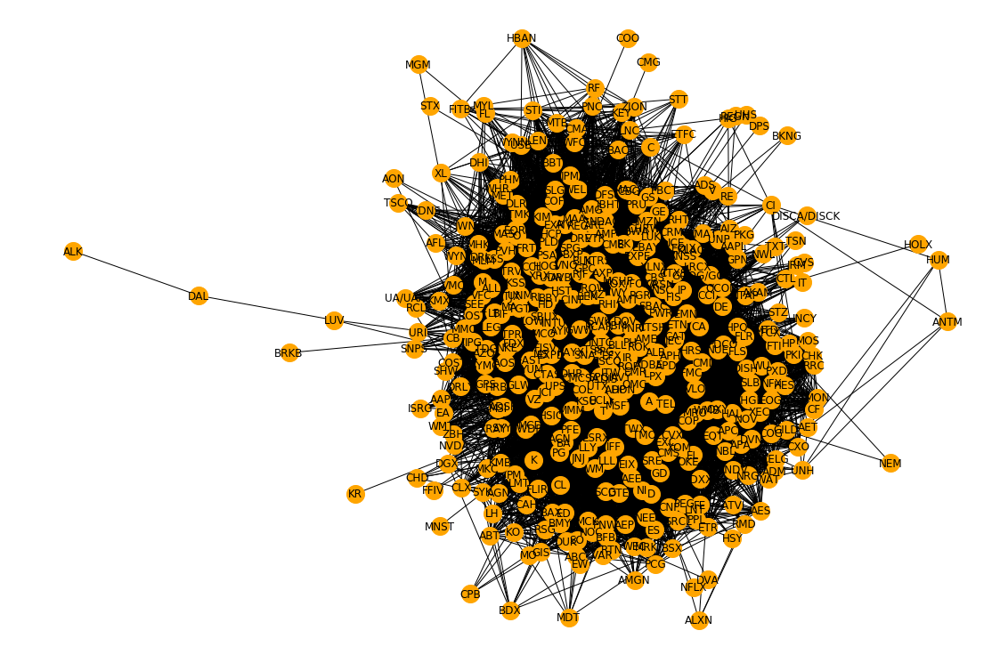

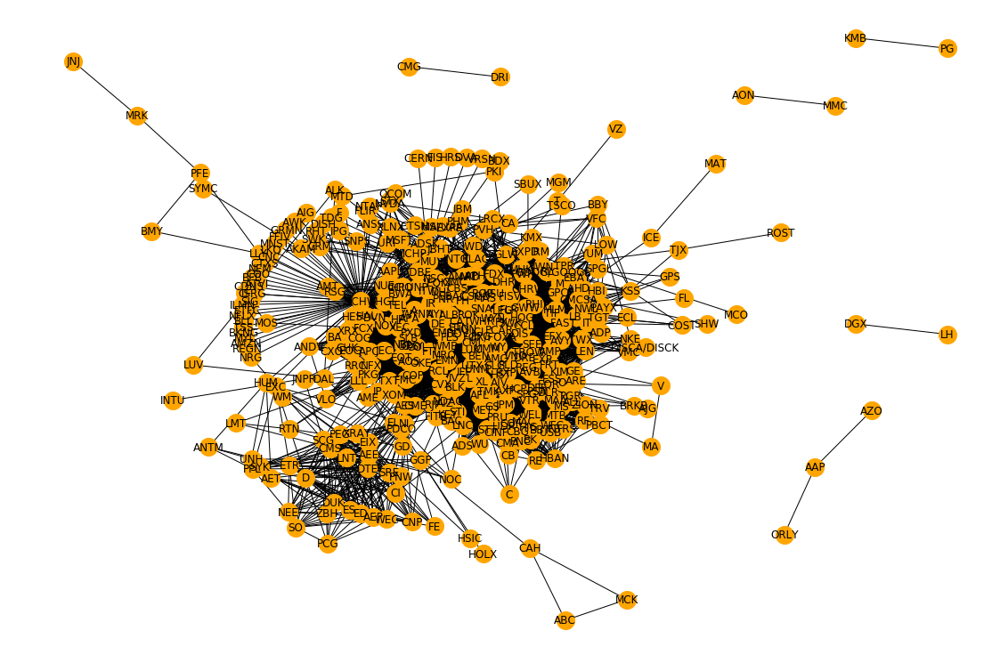

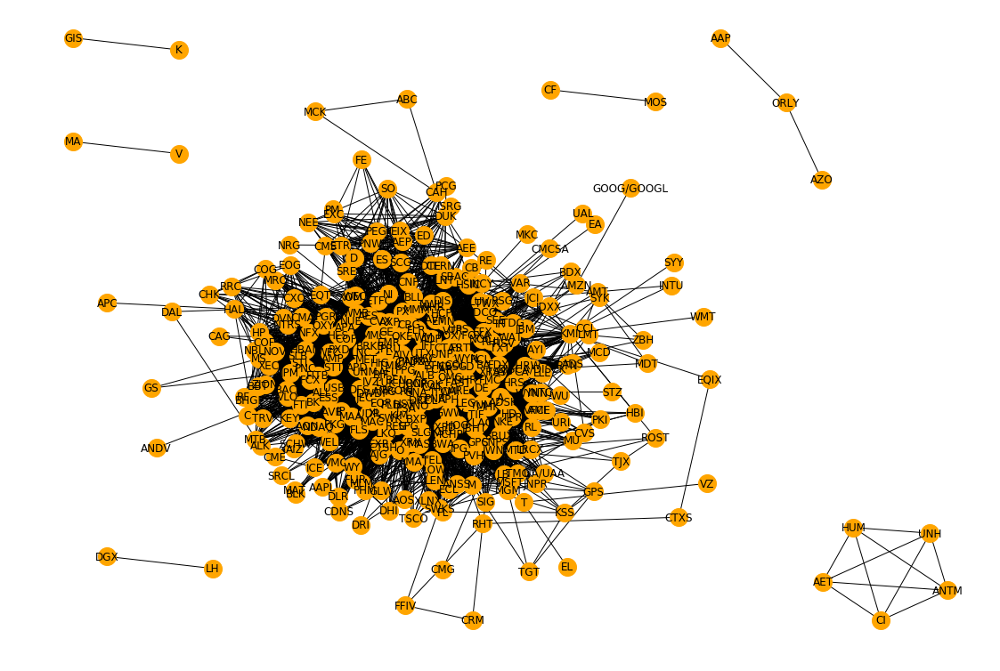

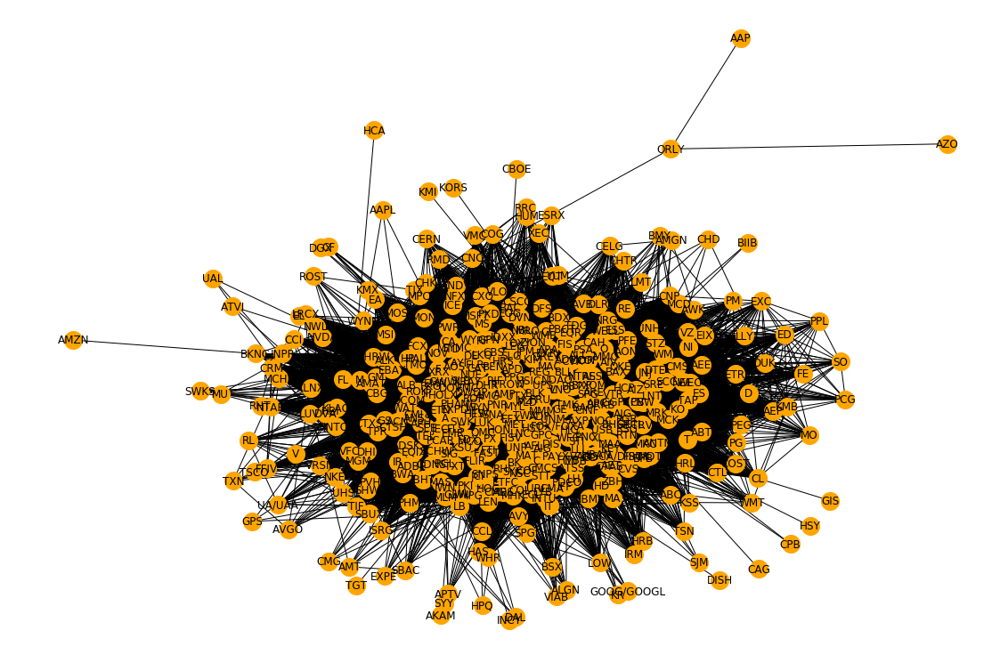

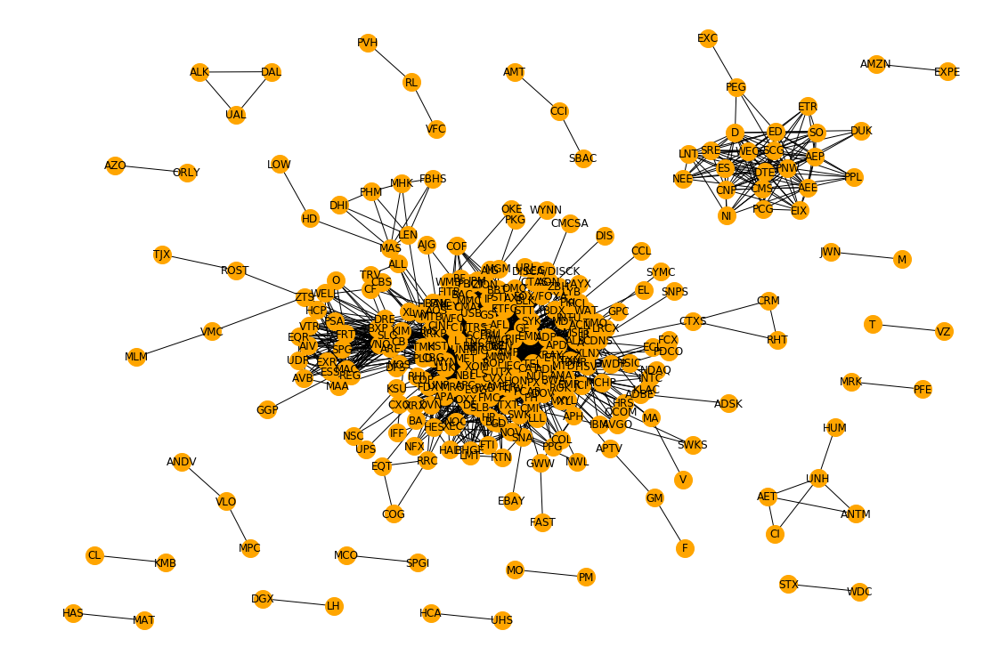

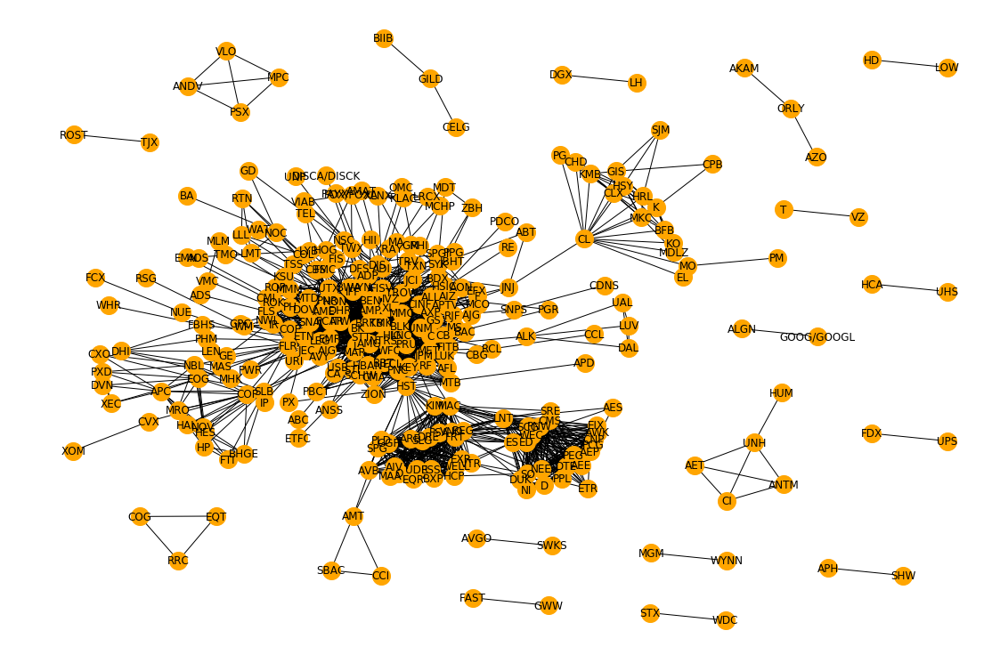

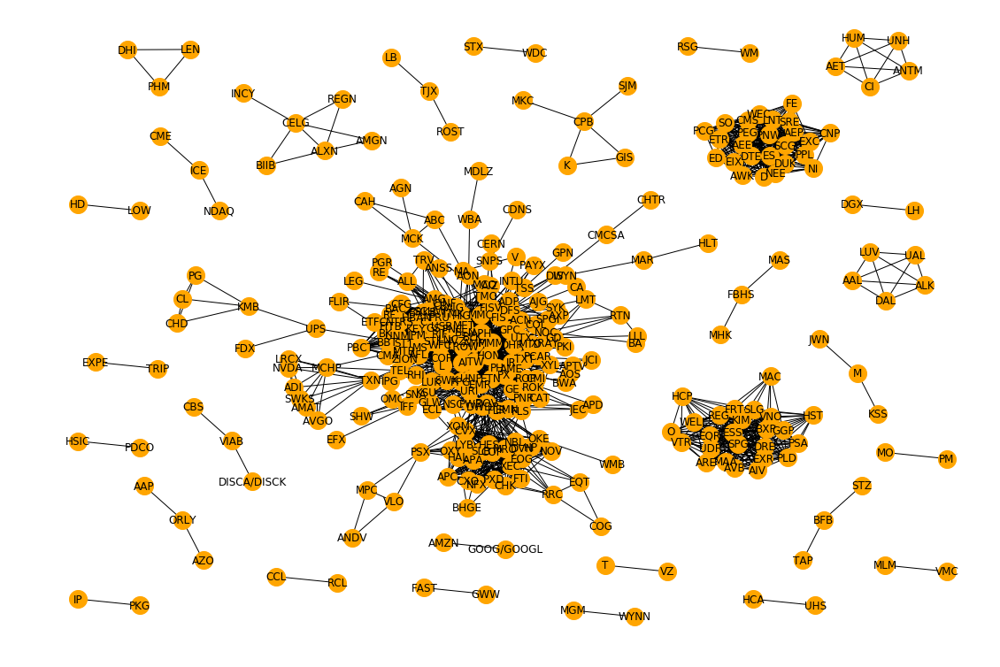

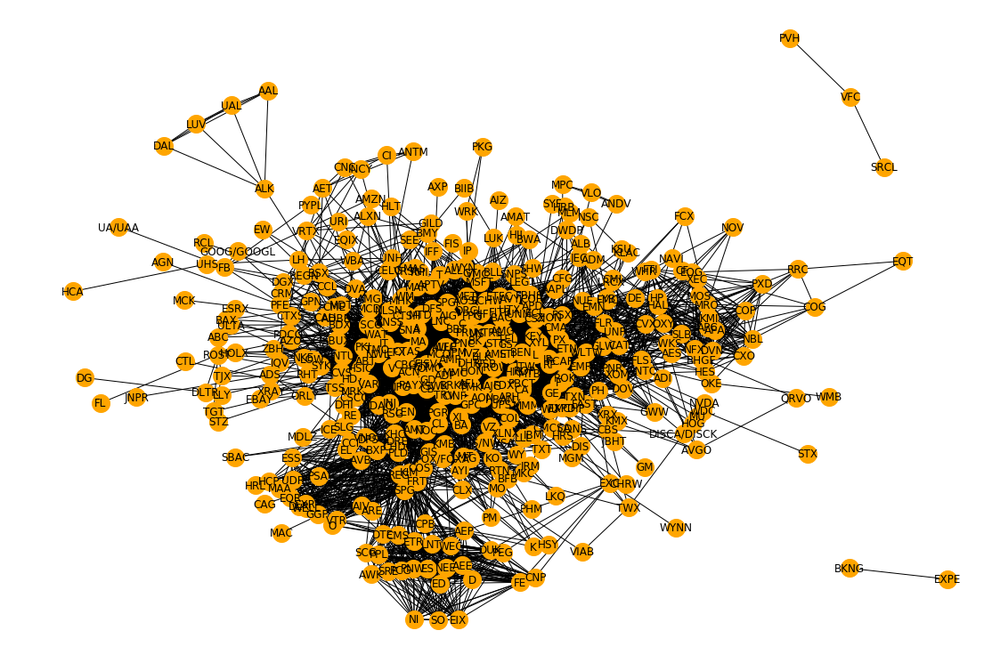

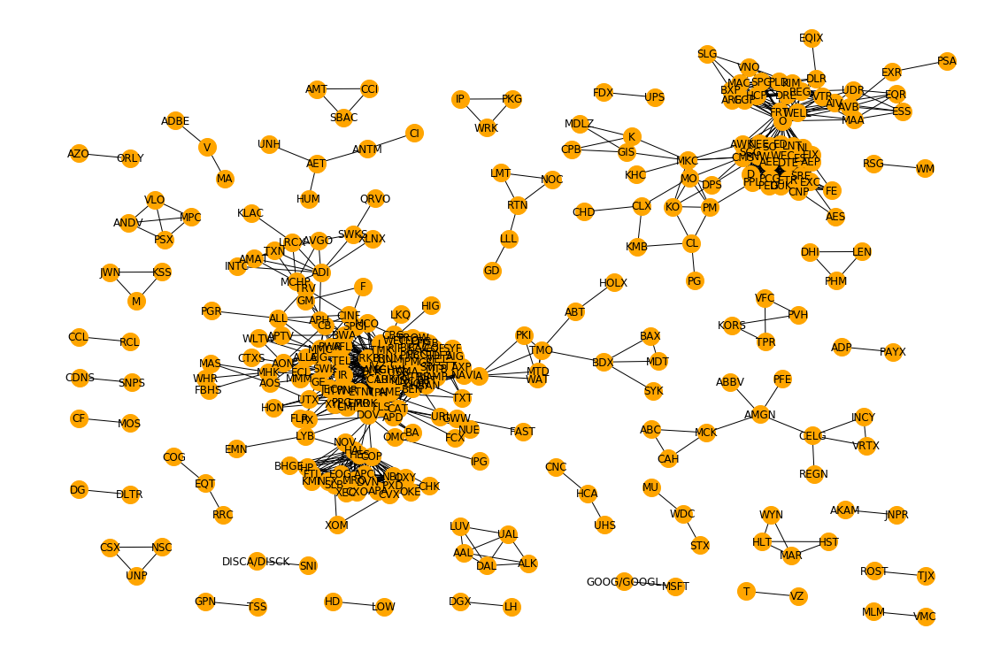

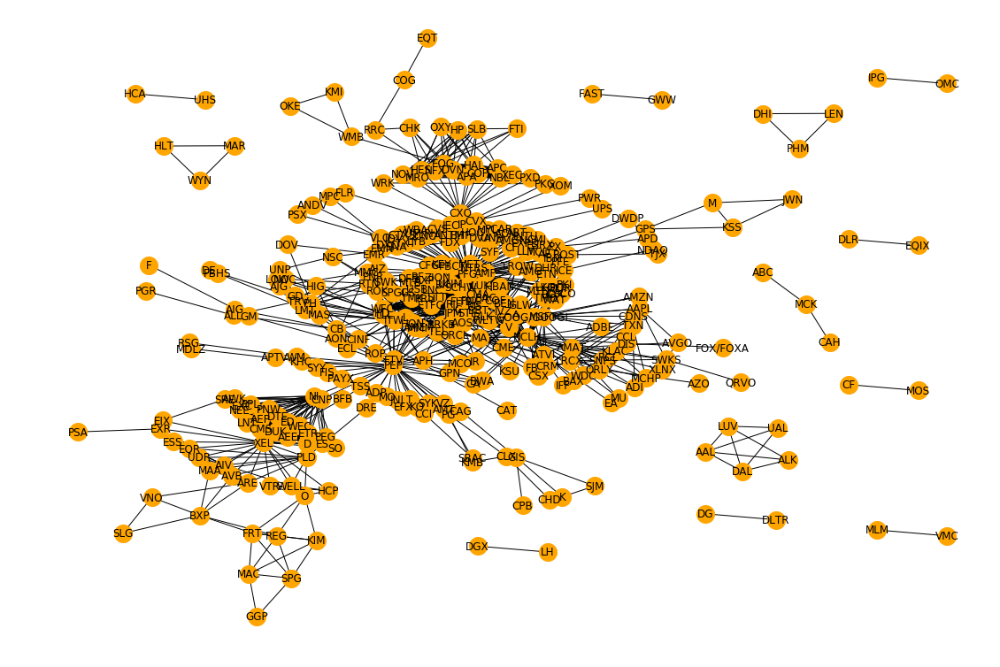

In [27]:
def create_network_graphs(num_csv):
    
    '''Creates network graphs using node/edge lists derived from the binary correlation matrix dataframes'''
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 15
    fig_size[1] = 10
        
    year_list, graph_list = [], [] 
    node_list, edge_list, comp_list, max_size, avg_size, clust_coeff = [], [], [], [], [], []
    
    # Read binary correlation matrix csv files into dataframes and append to a list
    for i in range(1, num_csv+1):
        year_list.append(pd.read_csv('year'+str(i)+'_logret.csv'))
    print(len(year_list))
    
    # Create node/edge tables of each dataframe
    for j in range(len(year_list)):
        year_list[j].set_index('Unnamed: 0', inplace=True)
        year_list[j].index.name = None
        links = year_list[j].where(np.triu(np.ones(year_list[j].shape)).astype(np.bool))
        links = links.stack().reset_index()
        links.columns = ['stock1', 'stock2','value']
        links['value'] = links['value'].astype(int)
        links_filtered = links.loc[(links['value'] == 1)]
        
        
        # Draw network graphs and save to png files
        G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')
        graph_list.append(G)

        node_list.append(len(G.nodes)) 
        edge_list.append(len(G.edges))
        
        # Separate network into disconnected components, compute average clustering coefficient
        subgraphs = list(nx.connected_component_subgraphs(G))
        comp_list.append(len(subgraphs))
        
        comp_size = []
        for graph in subgraphs:
            comp_size.append(len(graph))
            
        max_size.append(round(np.max(comp_size), 4))
        avg_size.append(round(np.mean(comp_size), 4))
        clust_coeff.append(round(nx.average_clustering(G),4))
        
        nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=12)  
        plt.savefig('year'+str(j+1)+'_logret.png')
        plt.show()
        plt.close()
    
    # Create table showing no. of nodes, edges, components, max component size and avg component size for each year
    df_graph_stats = pd.DataFrame(node_list, columns=['num_connected_nodes'])
    df_graph_stats['num_edges'] = edge_list
    df_graph_stats['num_components'] = comp_list
    df_graph_stats['max_component_size'] = max_size
    df_graph_stats['avg_component_size'] = avg_size
    df_graph_stats['avg_clustering_coeff'] = clust_coeff
    df_graph_stats.index += 1
    df_graph_stats.index.name = 'year' 
    
    return graph_list, df_graph_stats

# Implementation                    
simple_graph_list, df_graph_stats = create_network_graphs(10)

In [28]:
# Inspect dataframe
df_graph_stats

,num_connected_nodes,num_edges,num_components,max_component_size,avg_component_size,avg_clustering_coeff
year,,,,,,
1,412,22603,1,412,412.0000,0.7237
2,383,9155,6,372,63.8333,0.5827
3,354,13791,7,338,50.5714,0.7188
4,432,43770,1,432,432.0000,0.8336
5,309,2934,19,245,16.2632,0.5641
6,305,2019,18,263,16.9444,0.5814
7,320,2527,30,195,10.6667,0.6038
8,423,7340,3,418,141.0000,0.6632
9,321,2096,35,156,9.1714,0.5634


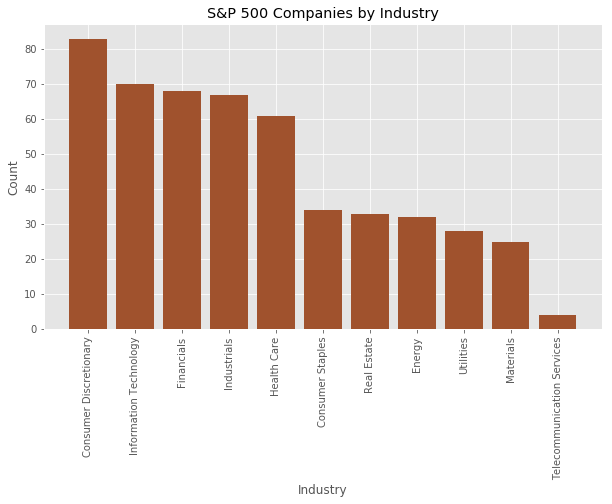

,Count
Industry,
Consumer Discretionary,83
Information Technology,70
Financials,68
Industrials,67
Health Care,61
Consumer Staples,34
Real Estate,33
Energy,32
Utilities,28


In [29]:
companies = pd.read_csv('SP 500 Data/sp500.csv')

def divide_companies_by_industry(df):
    
    '''Creates bar chart aggregating companies by industry and dictionary of 
    companies allocated to each industry'''
    
    df.rename(columns = {'SP500': 'Company'}, inplace=True)
    first_words = df.apply(lambda x: x.str.split().str[0])
    df.Company = first_words.Company

    df.Company.replace('BF/B', 'BFB', inplace=True)
    df.Company.replace('BRK/B', 'BRKB', inplace=True)

    industries = df.groupby('Industry').count().sort_values(['Company'], ascending=False)
    industries.rename(columns={'Company': 'Count'}, inplace=True)

    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 10
    fig_size[1] = 8
    
    plt.bar(industries.index, industries.Count, color='sienna')
    plt.xlabel('Industry')
    plt.ylabel('Count')
    plt.title('S&P 500 Companies by Industry')
    plt.xticks(rotation=90)
    plt.gcf().subplots_adjust(bottom=0.35)
    plt.savefig('companies_by_industry.png')
    plt.show()
    plt.close()
    
    df.set_index('Company', inplace=True)
    comp_dict = df.to_dict()

    dual_comp = ['DISCA/DISCK', 'FOX/FOXA', 'GOOG/GOOGL', 'NWS/NWSA', 'UA/UAA']

    node_dict = dict(G.nodes())

    for node in node_dict:
        for ticker in dual_comp:
            if node == ticker:
                new_node = node.split('/')[0]
                break
            else:
                new_node = node
        node_dict[node] = comp_dict['Industry'][new_node]
    

    return industries, node_dict


# Implementation
industries, node_dict = divide_companies_by_industry(companies)

industries

10


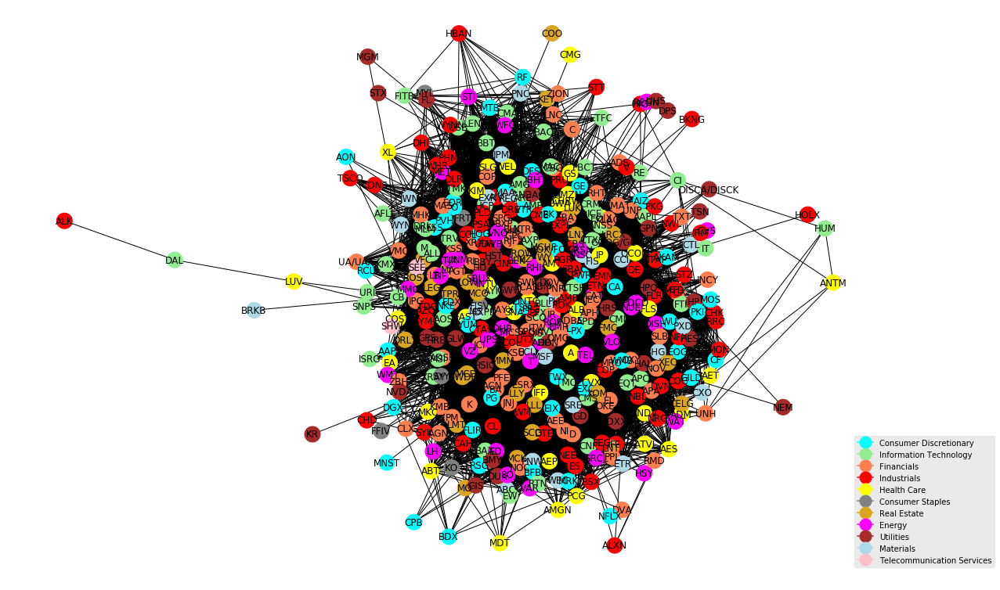

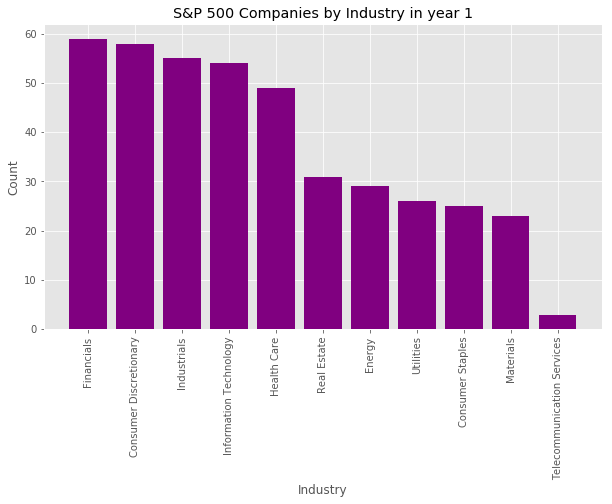

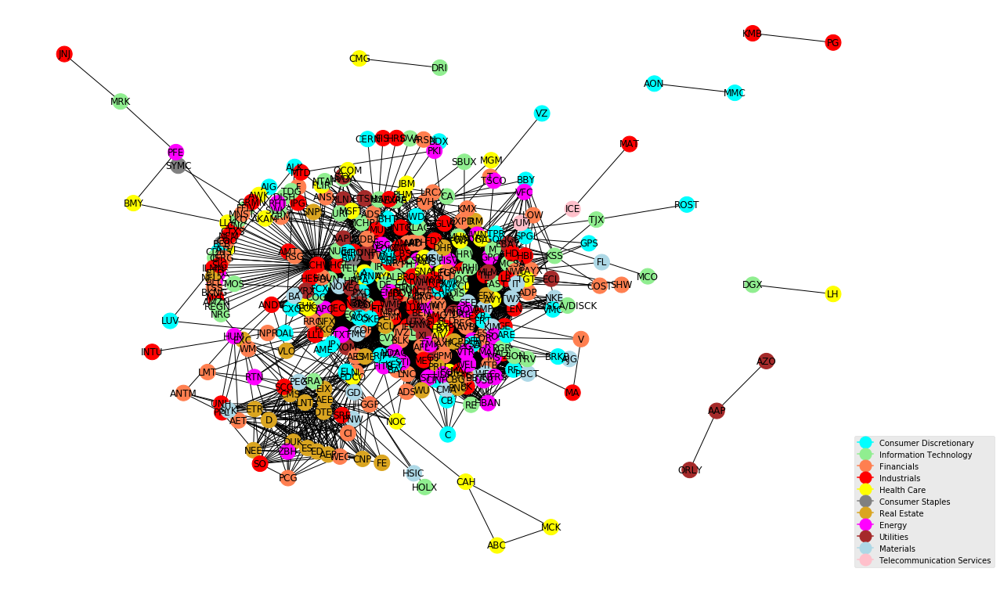

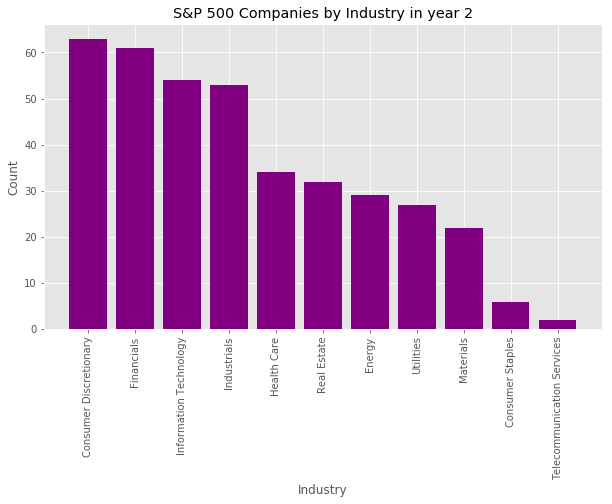

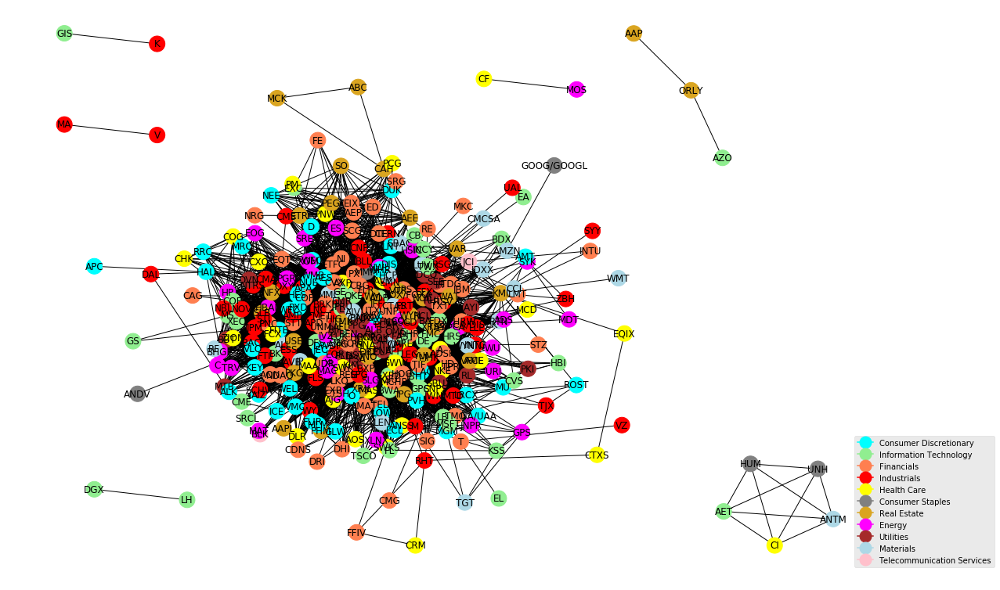

...

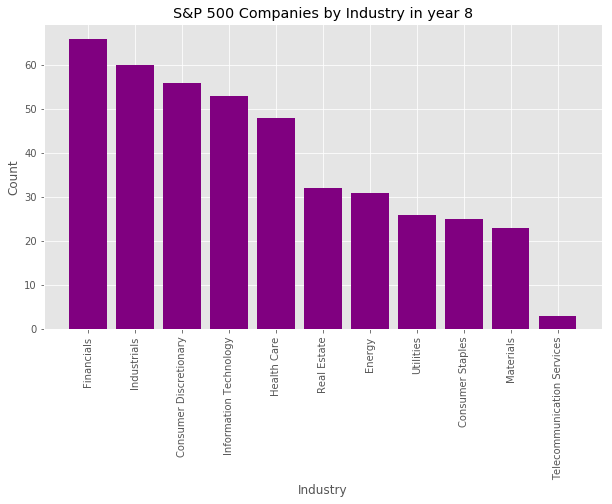

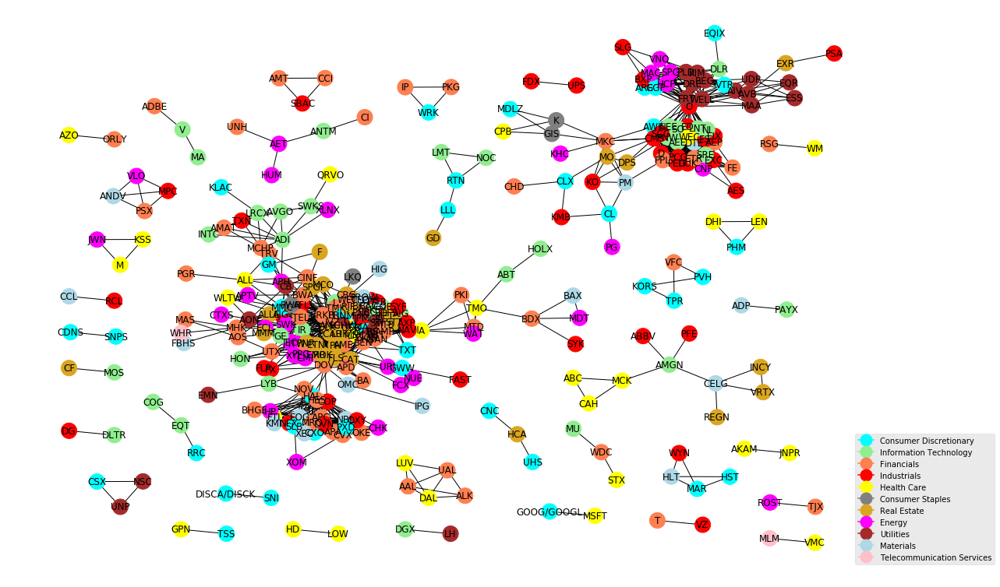

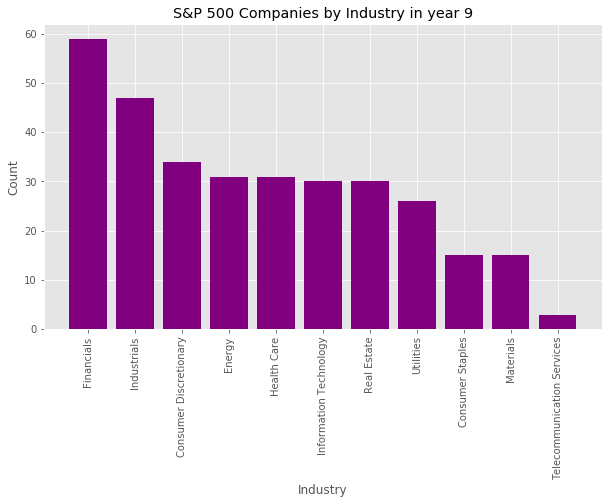

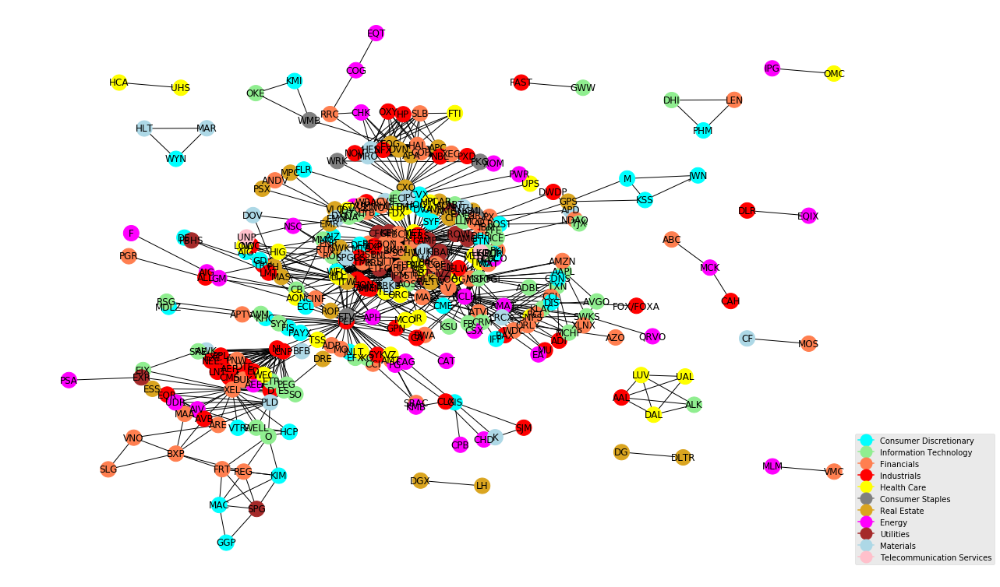

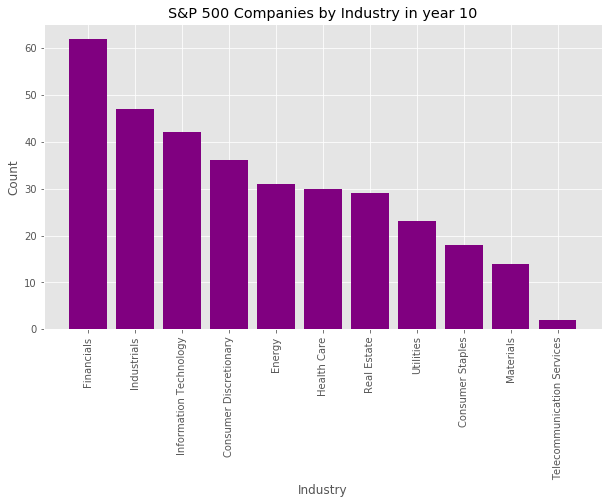

10


In [35]:
def create_networks_by_industry(num_csv):
    
    '''Creates network graphs using node/edge lists and allocates a different color to each industry'''
      
    color_map = {}
    colors = ['cyan', 'lightgreen', 'coral', 'red', 'yellow', 'gray', 'goldenrod', 'magenta', 'brown', 'lightblue', 'pink']
        
    year_list, graph_list = [], []
    
    # Read binary correlation matrix csv files into dataframes and append to a list
    for i in range(1, num_csv+1):
        year_list.append(pd.read_csv('year'+str(i)+'_logret.csv'))
    print(len(year_list))
    
    # Create node/edge tables of each dataframe to draw network graphs and save to png files
    for j in range(len(year_list)):
        year_list[j].set_index('Unnamed: 0', inplace=True)
        year_list[j].index.name = None
        links = year_list[j].where(np.triu(np.ones(year_list[j].shape)).astype(np.bool))
        links = links.stack().reset_index()
        links.columns = ['stock1', 'stock2','value']
        links['value'] = links['value'].astype(int)
        links_filtered = links.loc[(links['value'] == 1) & (links['stock1'] != links['stock2'])]
        
    
        # Allocate a different color to each industry
        k = 0
        for index in industries.index:
            color_map[index] = colors[k]
            k += 1

        G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')
        graph_list.append(G)
        
        # Plot network graph with legend using different colors for nodes depending on industry
        fig_size = plt.rcParams["figure.figsize"]
        fig_size[0] = 15
        fig_size[1] = 10
    
        legend_circles = []
        for c in range(len(colors)):
            legend_circles.append(Line2D([0], [0], marker='o', color=colors[c], label=industries.index[c], markerfacecolor=colors[c], markersize=15))

        nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color=[color_map[node_dict[node]] for node in node_dict], node_size=400, edge_color='black', linewidths=1, font_size=12)
        plt.legend(handles=legend_circles, loc='lower right', bbox_to_anchor=(1.15,0))
        
        plt.savefig('year'+str(j+1)+'_industry.png', bbox_inches='tight')
        plt.show()
        plt.close()

    
        # Plot bar chart of distribution of industries in network
        dict_nodes = dict(G.nodes())

        for node in dict_nodes:
            for ticker in dual_comp:
                if node == ticker:
                    new_node = node.split('/')[0]
                    break
                else:
                    new_node = node
            dict_nodes[node] = comp_dict['Industry'][new_node]

        node_ind = pd.DataFrame.from_dict(dict_nodes, orient='index')
        node_ind.rename(columns={0: 'Industry'}, inplace=True)
        node_ind.index.names = ['Company']
        ind_freq = pd.DataFrame(node_ind.groupby('Industry').size())
        ind_freq.rename(columns={0: 'Count'}, inplace=True)
        ind_freq.sort_values(['Count'], ascending=False, inplace=True)
        
        fig_size = plt.rcParams["figure.figsize"]
        fig_size[0] = 10
        fig_size[1] = 8
        
        plt.bar(ind_freq.index, ind_freq['Count'], color='purple')
        plt.xlabel('Industry')
        plt.ylabel('Count')
        plt.title('S&P 500 Companies by Industry in year '+str(j+1))
        plt.xticks(rotation=90)
        plt.gcf().subplots_adjust(bottom=0.35)
        plt.savefig('year'+str(j+1)+'_bars.png')
        plt.show()
        plt.close()
    print(len(graph_list))
    
    return graph_list
    
    
# Implementation      
colored_graph_list = create_networks_by_industry(10)

In [ ]:
# Optional if already ran the previous two functions!

def create_network_graphs(num_csv):
    
    '''Creates network graphs using node/edge lists both in one color and in multiple colors to indicate industry'''
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 15
    fig_size[1] = 10
    
    color_map = {}
    colors = ['cyan', 'lightgreen', 'orange', 'red', 'yellow', 'gray', 'goldenrod', 'magenta', 'brown', 'lightblue', 'pink']

        
    year_list, graph_list = [], []
    
    # Read binary correlation matrix csv files into dataframes and append to a list
    for i in range(1, num_csv+1):
        year_list.append(pd.read_csv('year'+str(i)+'_logret.csv'))
    print(len(year_list))
    
    # Create node/edge tables of each dataframe to draw network graphs and save to png files
    for j in range(len(year_list)):
        year_list[j].set_index('Unnamed: 0', inplace=True)
        year_list[j].index.name = None
        links = year_list[j].where(np.triu(np.ones(year_list[j].shape)).astype(np.bool))
        links = links.stack().reset_index()
        links.columns = ['stock1', 'stock2','value']
        links['value'] = links['value'].astype(int)
        links_filtered = links.loc[(links['value'] == 1) & (links['stock1'] != links['stock2'])]
        
    
        # Allocate a different color to each industry
        k = 0
        for index in industries.index:
            color_map[index] = colors[k]
            k += 1

        G = nx.from_pandas_edgelist(links_filtered, 'stock1', 'stock2')
        graph_list.append(G)
        
        # Plot simple network graph      
        nx.draw(G, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=12)  
        #plt.savefig('year'+str(j+1)+'_logret.png')
        plt.close()
      
    
        # Plot network graph with legend using different colors for nodes depending on industry
        legend_circles = []
        for c in range(len(colors)):
            legend_circles.append(Line2D([0], [0], marker='o', color=colors[c], label=industries.index[c], markerfacecolor=colors[c], markersize=15))

        nx.draw(G, pos=graphviz_layout(G), with_labels=True, node_color=[color_map[node_dict[node]] for node in node_dict], node_size=400, edge_color='black', linewidths=1, font_size=16)
        plt.legend(handles=legend_circles, loc='lower right', bbox_to_anchor=(1.15,0))
        #plt.savefig('year'+str(j+1)+'_industry.png', bbox_inches='tight')
        plt.close()
        
    print(len(graph_list))
    
    return graph_list


# Implementation
graph_list = create_network_graphs(10)   

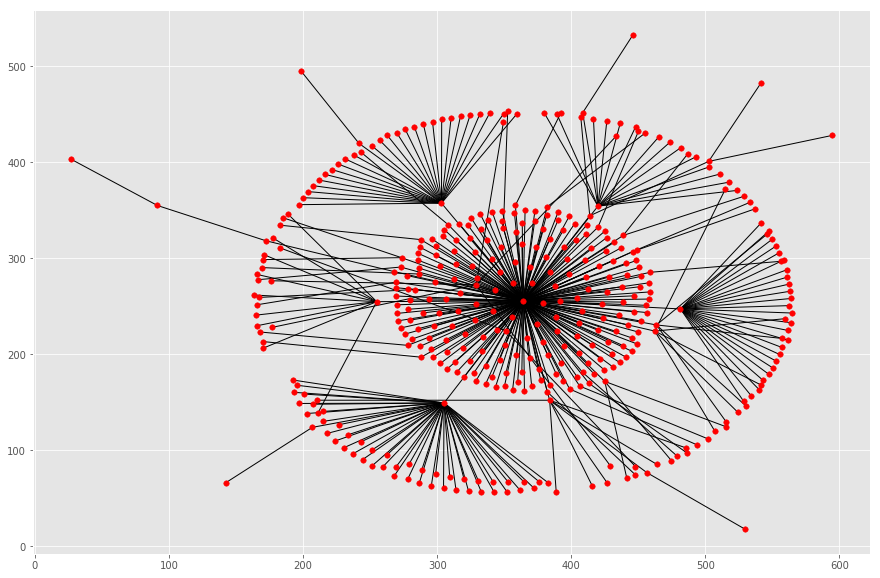

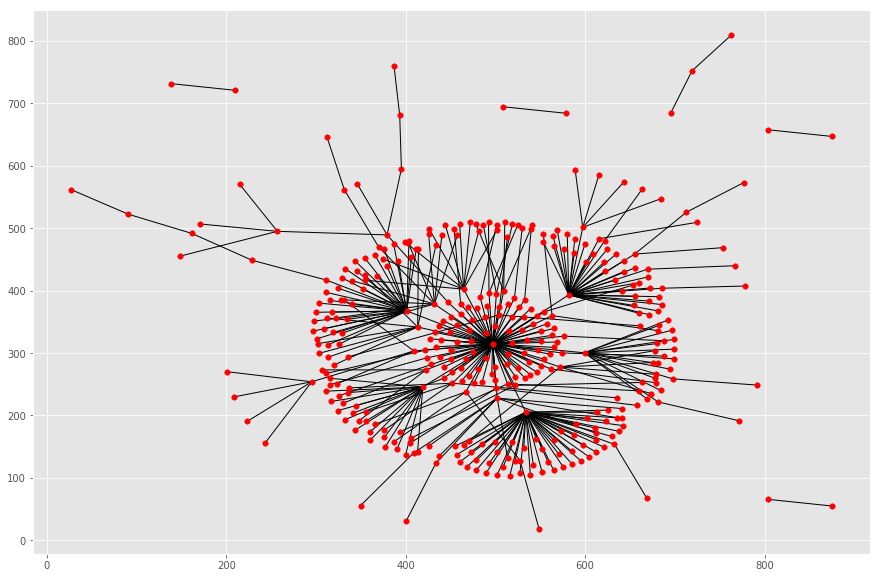

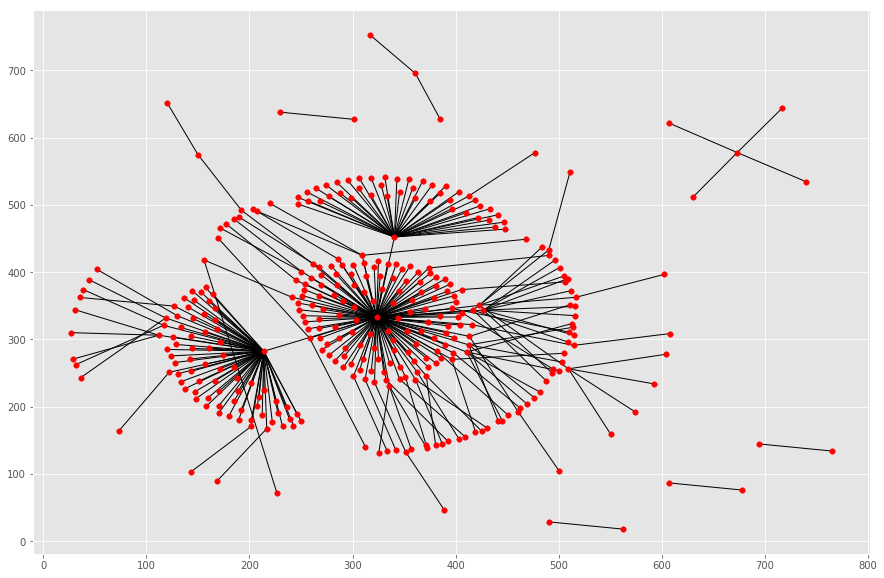

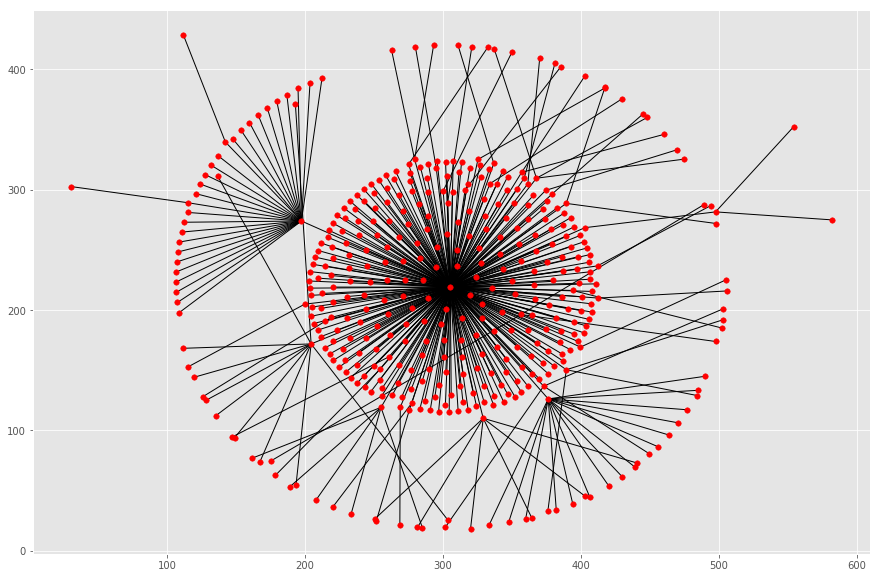

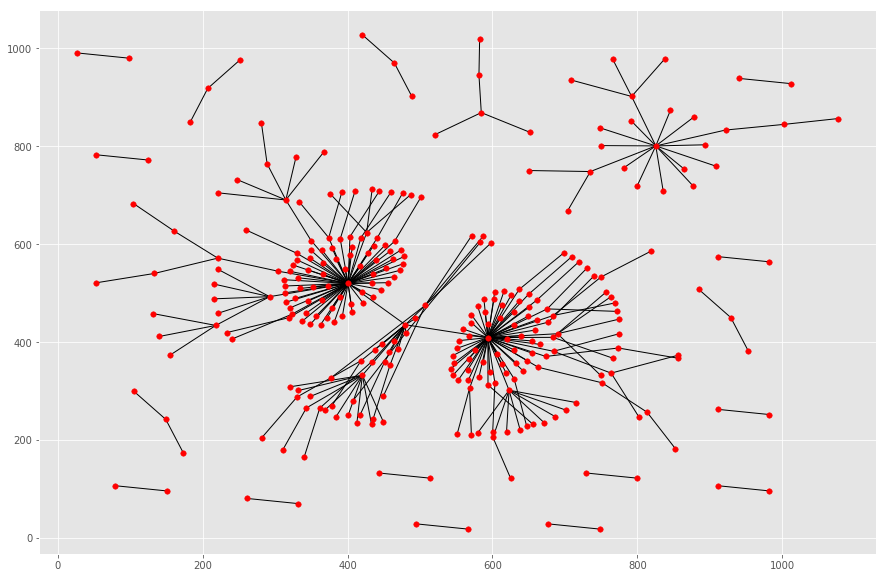

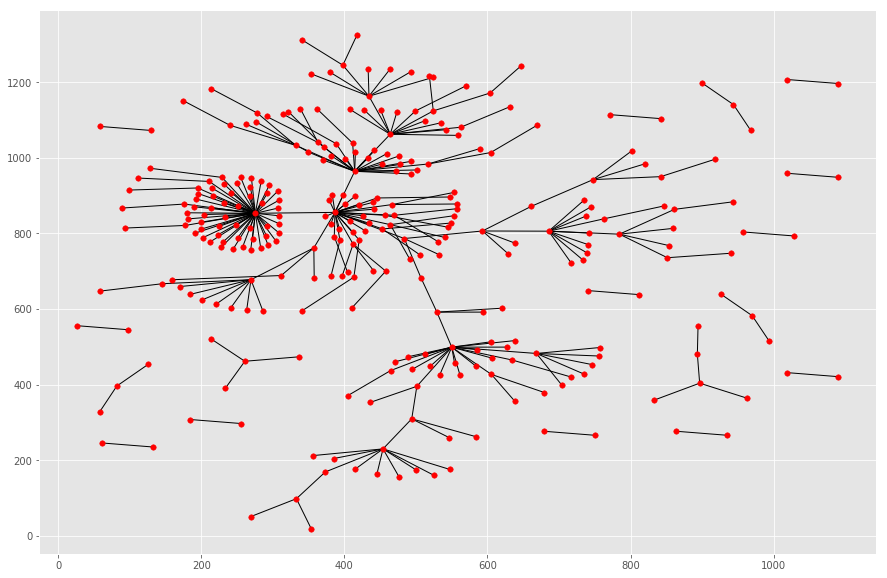

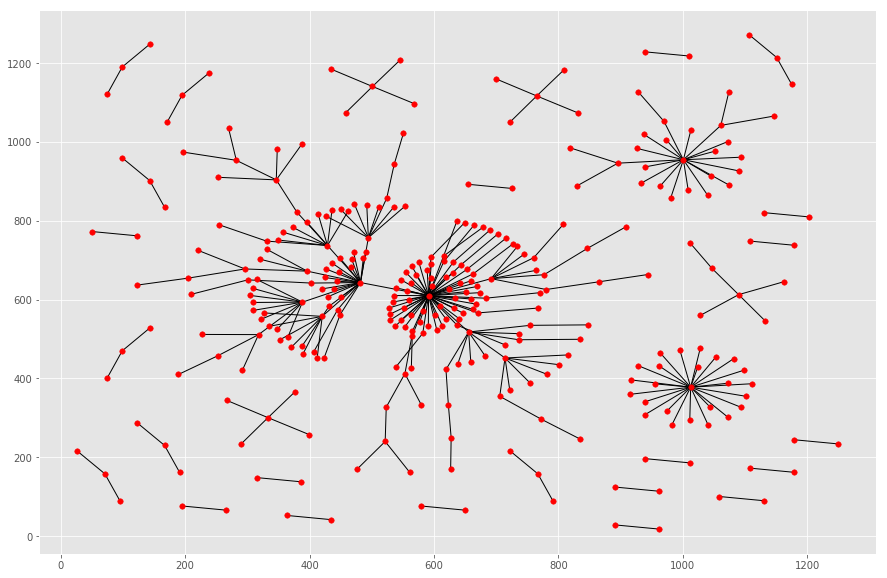

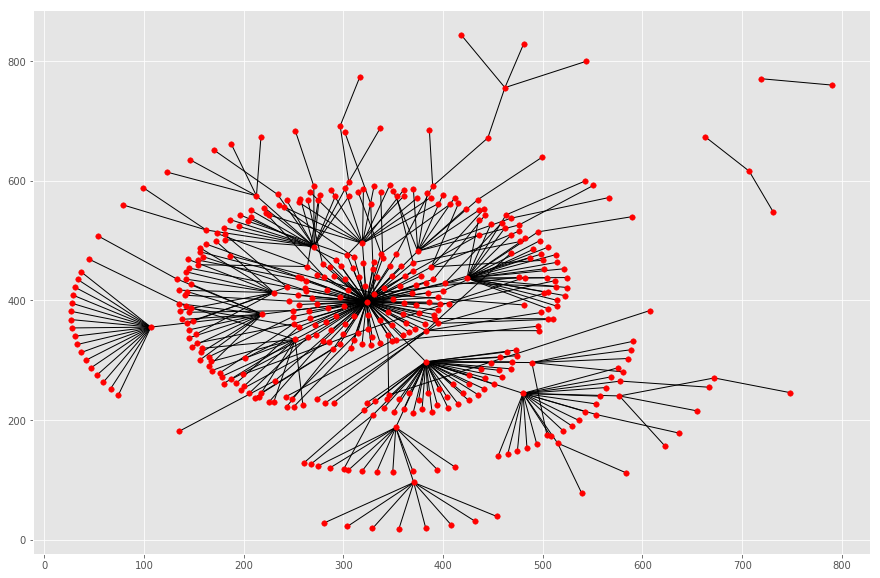

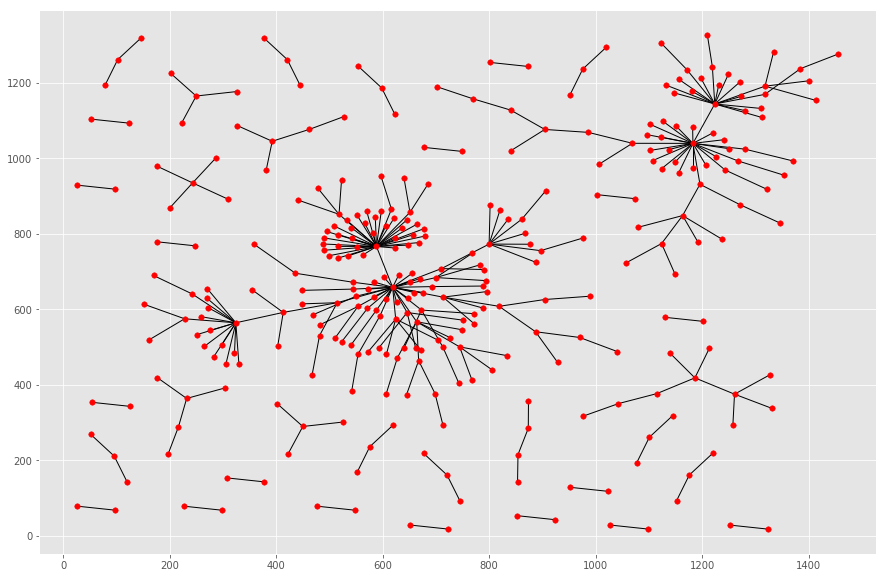

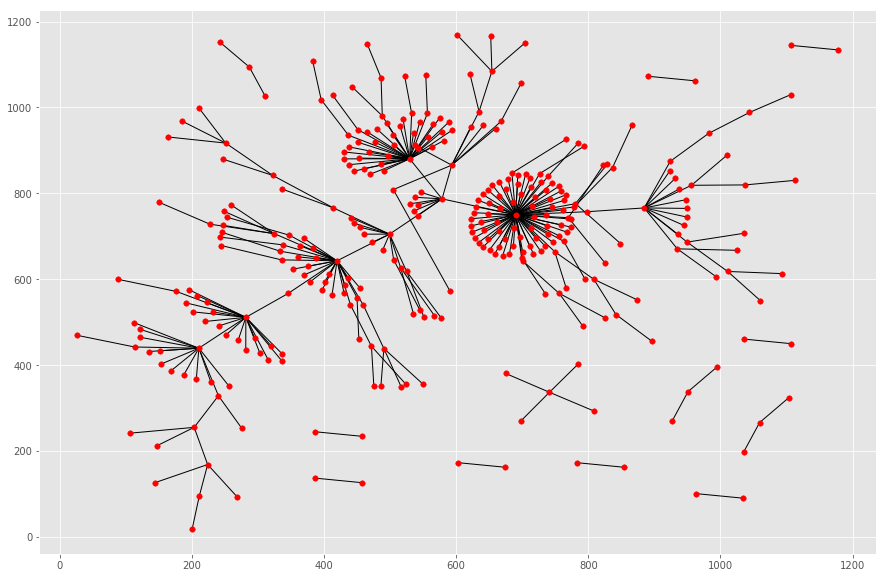

10


In [33]:
def create_mst_graphs(graph_list):
    
    '''Draw Minimum Spanning Trees of each network'''
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 15
    fig_size[1] = 10

    mst_list = []
    
    for g in range(len(graph_list)):
        T = nx.minimum_spanning_tree(graph_list[g])
        mst_list.append(T)
        
        plt.figure()
        nx.draw_networkx(T, pos=graphviz_layout(T), with_labels=False, node_size=30)
        plt.savefig('year'+str(g+1)+'_mst.png')
        plt.show()
        plt.close()
    
    print(len(mst_list))
    
    return mst_list

# Implementation
mst_list = create_mst_graphs(colored_graph_list)

In [ ]:
# Graph MSTs for different correlation thresholds and compare
# Make graphs for the table of graph_stats for better visualization

In [ ]:
# Linear regression and decision tree for model to predict how the network will change in the future:
# (which companies will leave the network of highly correlated companies and which will leave the center to move to the
# periphery based on features like industry, log returns, centrality measures, position in network etc.)

# Then add an extra feature (volume) and graph by making network nodes bigger, and do regression + tree for new model
# to see if there is any improvement

# Talk about the implications of changing network structure for investors when constructing portfolios of these stocks